<a href="https://colab.research.google.com/github/JohnalEco/Hurtos_Medellin/blob/main/Machine_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [157]:
import pandas as pd
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive

In [158]:
 drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [169]:
hurto_a_persona = pd.read_csv("/content/drive/MyDrive/hurtos/hurto_a_persona.csv")
hurto_a_persona['fecha_hecho'] = pd.to_datetime(hurto_a_persona['fecha_hecho'])
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")
hurto_a_persona.head(10)


<ipython-input-169-43fe2e7358d3>:1: DtypeWarning: Columns (25) have mixed types. Specify dtype option on import or set low_memory=False.
  hurto_a_persona = pd.read_csv("/content/drive/MyDrive/hurtos/hurto_a_persona.csv")


,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,lugar,sede_receptora,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion
0,2017-01-01 01:00:00-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Vía pública,Doce de Octubre,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
1,2017-01-01 15:00:00-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Candelaria,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
2,2017-01-01 14:00:00-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
3,2017-01-01 16:00:00-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Aranjuez,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
4,2017-01-01 16:00:00-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Laureles,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
5,2017-01-01 16:00:00-05:00,1.0,6.219071,-75.602996,Mujer,29,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Vía pública,Belén,Elementos escolares,Elementos escolares,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
6,2017-01-01 20:30:00-05:00,1.0,6.317709,-75.678259,Hombre,27,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Doce de Octubre,Cámara,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
7,2017-01-01 16:00:00-05:00,1.0,6.268307,-75.558457,Hombre,36,Soltero(a),Sin dato,Sin dato,Sin dato,...,Hospital o centro de salud,Aranjuez,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
8,2017-01-01 00:30:00-05:00,1.0,6.242797,-75.554797,Hombre,41,Casado(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Buenos Aires,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00
9,2017-01-01 08:00:00-05:00,1.0,6.246823,-75.562114,Hombre,59,Soltero(a),Sin dato,Sin dato,Sin dato,...,Vía pública,Candelaria,Peso,"Dinero, joyas, piedras preciosas y título valor",Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00


In [170]:

media_lat = hurto_a_persona['latitud'].mean()
std_lat = hurto_a_persona['latitud'].std()

media_long = hurto_a_persona['longitud'].mean()
std_long = hurto_a_persona['longitud'].std()

# Establecer el factor para el rango de desviación estándar
factor = 2

limite_inferior_lat = media_lat - factor * std_lat
limite_superior_lat = media_lat + factor * std_lat

limite_inferior_long = media_long - factor * std_long
limite_superior_long = media_long + factor * std_long

hurto_a_persona_filtrado = hurto_a_persona[
    (hurto_a_persona['latitud'] >= limite_inferior_lat) &
    (hurto_a_persona['latitud'] <= limite_superior_lat) &
    (hurto_a_persona['longitud'] >= limite_inferior_long) &
    (hurto_a_persona['longitud'] <= limite_superior_long)
]

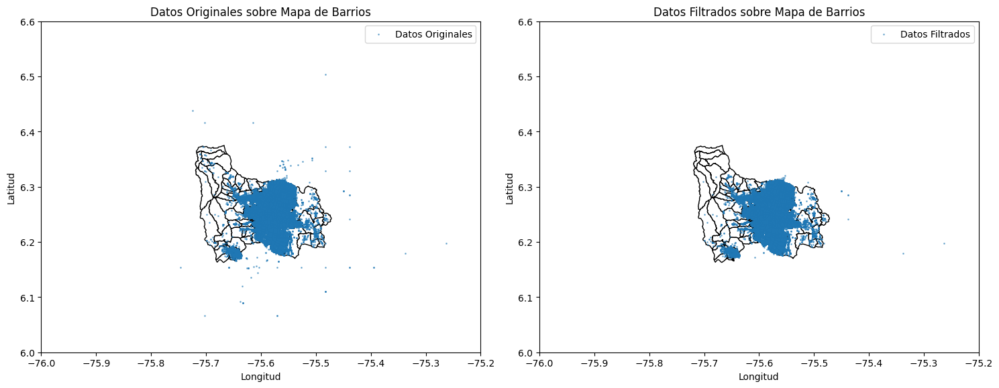

In [171]:

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 7))


barrios.plot(ax=ax1, edgecolor='black', color='white')
ax1.scatter(hurto_a_persona['longitud'], hurto_a_persona['latitud'], s=1, alpha=0.5, label='Datos Originales')
ax1.set_title('Datos Originales sobre Mapa de Barrios')
ax1.set_xlabel('Longitud')
ax1.set_ylabel('Latitud')
ax1.set_xlim(-76, -75.2)
ax1.set_ylim(6, 6.6)
ax1.legend()

barrios.plot(ax=ax2, edgecolor='black', color='white')
ax2.scatter(hurto_a_persona_filtrado['longitud'], hurto_a_persona_filtrado['latitud'], s=1, alpha=0.5, label='Datos Filtrados')
ax2.set_title('Datos Filtrados sobre Mapa de Barrios')
ax2.set_xlabel('Longitud')
ax2.set_ylabel('Latitud')
ax2.set_xlim(-76, -75.2)
ax2.set_ylim(6, 6.6)
ax2.legend()

plt.tight_layout()
plt.show()
hurto_a_persona = hurto_a_persona_filtrado

In [172]:
nan_por_columna = hurto_a_persona.isna().sum()

# Imprime los resultados
print("Cantidad de NaN por cada columna:")
print(nan_por_columna)

Cantidad de NaN por cada columna:
fecha_hecho            0
cantidad               0
latitud                0
longitud               0
sexo                   0
edad                   0
estado_civil           0
grupo_actor            0
actividad_delictiva    0
parentesco             0
ocupacion              0
discapacidad           0
grupo_especial         0
medio_transporte       0
nivel_academico        0
testigo                0
conducta               0
modalidad              0
caracterizacion        0
conducta_especial      0
arma_medio             0
articulo_penal         0
categoria_penal        0
nombre_barrio          0
codigo_barrio          0
codigo_comuna          0
lugar                  0
sede_receptora         0
bien                   0
categoria_bien         0
grupo_bien             0
modelo                 0
color                  0
permiso                0
unidad_medida          0
fecha_ingestion        0
dtype: int64


In [174]:
mapeo_categorias = {
    'Vía pública': 'Transporte',
    'Terminal de transporte': 'Transporte',
    'Estación del Metro': 'Transporte',
    'Estación del Metro plus': 'Transporte',
    'Paradero de bus': 'Transporte',
    'Aeropuerto': 'Transporte',
    'Puente peatonal': 'Transporte',
    'Metro Plus': 'Transporte',
    'Peaje': 'Transporte',
    'Institución de educación superior': 'Educación',
    'Institución educativa (jardín, primaria o secundaria)': 'Educación',
    'Residencia': 'Residencial',
    'Casa o apartamento': 'Residencial',
    'Conjunto residencial': 'Residencial',
    'Caseta vigilancia conjunto residencial': 'Residencial',
    'Centro comercial': 'Comercial',
    'Local comercial': 'Comercial',
    'Supermercado': 'Comercial',
    'Almacén tienda y otro': 'Comercial',
    'Plaza de mercado': 'Comercial',
    'Joyería': 'Comercial',
    'Compraventa': 'Comercial',
    'Bar o cantina': 'Entretenimiento',
    'Casino': 'Entretenimiento',
    'Teatro': 'Entretenimiento',
    'Parque': 'Entretenimiento',
    'Escenario deportivo': 'Entretenimiento',
    'Gimnasio': 'Entretenimiento',
    'Estadero': 'Entretenimiento',
    'Hospital o centro de salud': 'Salud',
    'Oficina': 'Servicios',
    'Hotel, motel y hostal': 'Servicios',
    'Restaurante': 'Servicios',
    'Taller mecánico': 'Servicios',
    'Droguería o farmacia': 'Servicios',
    'Biblioteca': 'Servicios',
    'Cementerio': 'Servicios',
    'Instalación judicial': 'Servicios',
    'Panadería': 'Servicios',
    'Instalación fuerza pública': 'Servicios',
    'Sede social, club, auditorio o similar': 'Servicios',
    'Funeraria y sala de velación': 'Servicios',
    'Baño': 'Servicios',
    'Sede política': 'Servicios',
    'Cafetería': 'Servicios',
    'Café internet': 'Servicios',
    'Consultorio jurídico': 'Servicios',
    'Lavadero de carros': 'Servicios',
    'Obra en construcción': 'Otros',
    'Quebrada o rio': 'Otros',
    'Reserva natural': 'Otros',
    'Lote baldío': 'Otros',
    'Potrero': 'Otros',
    'Matadero, carnicería y similar': 'Otros',
    'Hipodromo': 'Otros',
    'Cantera': 'Otros',
    'Finca': 'Otros',
    'Feria de ganado': 'Otros',
    'Desguazadero': 'Otros',
    'Sin dato': 'Otros',
    'Fábrica o empresa': 'Industria',
    'Vehículo particular': 'Transporte',
    'Parqueadero': 'Comercial',
    'Banco': 'Servicios',
    'Bus de servicio público': 'Transporte',
    'Estación de gasolina': 'Comercial',
    'Casa de apuesta': 'Entretenimiento',
    'Piscina': 'Entretenimiento',
    'Bodega': 'Comercial',
    'Iglesia': 'Religioso',
    'Edificio': 'Comercial',
    'Cajero electrónico': 'Servicios',
    'Instalación gubernamental': 'Servicios',
    'Centro de belleza o estética': 'Servicios',
    'Plaza de toros': 'Entretenimiento',
    'Turístico': 'Entretenimiento',
    'Caseta de vigilancia empresa': 'Seguridad',
    'Laboratorios de procesamiento de droga ílicita': 'Salud',
    'Montallanta': 'Servicios',
    'Corporación': 'Servicios',
    'Cárcel': 'Seguridad',
    'Hogar de paso': 'Residencial',
    'Billar': 'Entretenimiento',
    'Albergue': 'Residencial',
    'Zona boscosa': 'Otros',
    'Empresa de transporte': 'Transporte',
    'Puesto de trabajo': 'Otros',
    'Prostíbulo': 'Entretenimiento',
    'Librería': 'Comercial',
    'Metro': 'Transporte',
    'Represa o laguna': 'Otros'
}

hurto_a_persona['lugar_agrupado'] = hurto_a_persona['lugar'].map(mapeo_categorias)


In [175]:
mapeo_modalidades = {
    'Atraco': 'Robo con Violencia o Amenaza',
    'Descuido': 'Robo con Engaño o Sin Violencia',
    'Cosquilleo': 'Robo con Engaño o Sin Violencia',
    'Raponazo': 'Robo con Violencia o Amenaza',
    'Sin dato': 'Delitos Específicos',
    'Engaño': 'Robo con Engaño o Sin Violencia',
    'Rompimiento cerraduta': 'Robo por Rompimiento o Acceso Forzado',
    'Escopolamina': 'Robo con Engaño o Sin Violencia',
    'Rompimiento de ventana': 'Robo por Rompimiento o Acceso Forzado',
    'Halado': 'Robo con Violencia o Amenaza',
    'Rompimiento cerradura': 'Robo por Rompimiento o Acceso Forzado',
    'Clonación de tarjeta': 'Robo con Engaño o Sin Violencia',
    'Comisión de delito': 'Delitos Específicos',
    'Suplantación': 'Robo con Engaño o Sin Violencia',
    'Paquete chileno': 'Robo con Engaño o Sin Violencia',
    'Abuso de confianza': 'Robo con Engaño o Sin Violencia',
    'Informático': 'Robo con Engaño o Sin Violencia',
    'Llave maestra': 'Robo con Engaño o Sin Violencia',
    'Fleteo': 'Robo con Violencia o Amenaza',
    'Miedo o terror': 'Delitos Específicos',
    'Simulando necesidad': 'Robo con Engaño o Sin Violencia',
    'Retención de tarjeta': 'Delitos Específicos',
    'Llamada millonaria': 'Robo con Engaño o Sin Violencia',
    'Forcejeo': 'Robo con Violencia o Amenaza',
    'Retención de dinero': 'Delitos Específicos',
    'Tóxico o agente químico': 'Robo con Engaño o Sin Violencia',
    'Enfrentamiento con la fuerza pública': 'Delitos Específicos',
    'Auto robo': 'Delitos Específicos',
    'Violencia intrafamiliar': 'Robo con Violencia o Amenaza',
    'Vandalismo': 'Robo por Rompimiento o Acceso Forzado'
}
hurto_a_persona['modalidad'] = hurto_a_persona['modalidad'].map(mapeo_modalidades)

In [176]:
datos_limpios = hurto_a_persona.dropna(subset=['latitud', 'longitud'])
datos_limpios = datos_limpios[(datos_limpios['latitud'] != 0) & (datos_limpios['longitud'] != 0)]

In [177]:
#Cargar el archivo shp
barrios = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")
barrios.head(5)

,CODIGO,NOMBRE,ABREVIATUR,IDENTIFICA,LIMITECOMU,ZHFISICAGE,LIMITEMUNI,VIGENCIA_F,SUBTIPO_BA,LINK_DOCUM,geometry
0,Inst_15,U.P.B,None,Inst_15,11,None,001,None,1,None,"POLYGON ((-75.58911 6.24447, -75.58900 6.24443..."
1,Inst_18,Cerro Nutibara,None,Inst_18,16,None,001,None,1,None,"POLYGON ((-75.57669 6.23733, -75.57628 6.23612..."
2,0610,Mirador del Doce,None,0610,06,None,001,None,1,None,"POLYGON ((-75.58450 6.30520, -75.58445 6.30519..."
3,1620,El Nogal-Los Almendros,None,1620,16,None,001,None,1,None,"POLYGON ((-75.59551 6.23662, -75.59552 6.23660..."
4,0612,El Triunfo,None,0612,06,None,001,None,1,None,"POLYGON ((-75.58618 6.31007, -75.58616 6.31007..."


In [178]:
gdf_hurtos = gpd.GeoDataFrame(datos_limpios, geometry=gpd.points_from_xy(datos_limpios.longitud, datos_limpios.latitud), crs='EPSG:4326')
gdf_hurtos.head(5)

,fecha_hecho,cantidad,latitud,longitud,sexo,edad,estado_civil,grupo_actor,actividad_delictiva,parentesco,...,bien,categoria_bien,grupo_bien,modelo,color,permiso,unidad_medida,fecha_ingestion,lugar_agrupado,geometry
0,2017-01-01 01:00:00-05:00,1.0,6.299703,-75.582016,Mujer,33,Unión marital de hecho,Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.58202 6.29970)
1,2017-01-01 15:00:00-05:00,1.0,6.250917,-75.566160,Mujer,26,Soltero(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.56616 6.25092)
2,2017-01-01 14:00:00-05:00,1.0,6.274836,-75.554909,Hombre,30,Soltero(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.55491 6.27484)
3,2017-01-01 16:00:00-05:00,1.0,6.276236,-75.553533,Hombre,37,Casado(a),Sin dato,Sin dato,Sin dato,...,Celular,Tecnología,Mercancía,-1,Negro,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.55353 6.27624)
4,2017-01-01 16:00:00-05:00,1.0,6.250339,-75.586914,Hombre,87,Casado(a),Sin dato,Sin dato,Sin dato,...,Billetera,Prendas de vestir y accesorios,Mercancía,-1,Sin dato,Sin dato,Sin dato,2024-06-06T04:06:57.000-05:00,Transporte,POINT (-75.58691 6.25034)


In [179]:
hurto_barrios = gpd.sjoin(gdf_hurtos, barrios)
print(hurto_barrios.info(verbose=True))

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 284005 entries, 0 to 298672
Data columns (total 49 columns):
 #   Column               Non-Null Count   Dtype                    
---  ------               --------------   -----                    
 0   fecha_hecho          284005 non-null  datetime64[ns, UTC-05:00]
 1   cantidad             284005 non-null  float64                  
 2   latitud              284005 non-null  float64                  
 3   longitud             284005 non-null  float64                  
 4   sexo                 284005 non-null  object                   
 5   edad                 284005 non-null  int64                    
 6   estado_civil         284005 non-null  object                   
 7   grupo_actor          284005 non-null  object                   
 8   actividad_delictiva  284005 non-null  object                   
 9   parentesco           284005 non-null  object                   
 10  ocupacion            284005 non-null  object         

In [180]:
# Definir los rangos de edad
bins = [0, 18, 30, 45, 60, 100]
labels = ['0-18', '19-30', '31-45', '46-60', '60+']

# Crear una nueva columna 'grupo_edad' en el DataFrame de hurtos
hurto_barrios['grupo_edad'] = pd.cut(hurto_barrios['edad'], bins=bins, labels=labels, right=False)

In [181]:
hurto_barrios['fecha_hecho'] = pd.to_datetime(hurto_barrios['fecha_hecho'])

In [182]:
hurto_barrios['año_hecho'] = hurto_barrios['fecha_hecho'].dt.year
hurto_barrios['mes_hecho'] = hurto_barrios['fecha_hecho'].dt.month
hurto_barrios['dia_semana_hecho'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['hora'] = hurto_barrios['fecha_hecho'].dt.hour
hurto_barrios['dia_semana'] = hurto_barrios['fecha_hecho'].dt.day_name()
hurto_barrios['mes'] = hurto_barrios['fecha_hecho'].dt.month
hurto_por_mes = hurto_barrios.groupby('mes').size()
hurto_barrios['dia_mes'] = hurto_barrios['fecha_hecho'].dt.day

In [183]:
hurto_barrios["medio_transporte"].unique()

array(['Caminata', 'Motocicleta', 'Automóvil', 'Sin dato', 'Taxi',
       'Autobus', 'Metro', 'Motocicleta con parrillero', 'Bicicleta',
       'Planeador'], dtype=object)

In [261]:
columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","mes_hecho","dia_semana_hecho","hora","dia_mes","arma_medio","medio_transporte","modalidad"]
#columnas_datos = ["latitud","longitud","sexo","edad","lugar_agrupado","codigo_comuna","grupo_bien","mes_hecho","dia_semana_hecho","hora","dia_mes"]
datos_regresion = hurto_barrios[columnas_datos]

In [262]:
nan_por_columna = datos_regresion.isna().sum()

# Imprime los resultados
print("Cantidad de NaN por cada columna:")
print(nan_por_columna)

Cantidad de NaN por cada columna:
latitud             0
longitud            0
sexo                0
edad                0
lugar_agrupado      0
mes_hecho           0
dia_semana_hecho    0
hora                0
dia_mes             0
arma_medio          0
medio_transporte    0
modalidad           0
dtype: int64


In [263]:
mapeo_arma_medio = {
    'Arma cortopunzante': 0,
    'No': 1,
    'Sin dato': 2,
    'Arma de fuego': 3,
    'Objeto contundente': 4,
    'Perro': 5,
    'Escopolamina': 6,
    'Llave maestra': 7,
    'Tóxico o Químico': 8,
    'Palanca': 9
}
datos_regresion['arma_medio'] = datos_regresion['arma_medio'].map(mapeo_arma_medio)

<ipython-input-263-af1778468f72>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['arma_medio'] = datos_regresion['arma_medio'].map(mapeo_arma_medio)


In [264]:
mapeo_medio_transporte = {
    'Caminata': 0,
    'Motocicleta': 1,
    'Automóvil': 2,
    'Sin dato': 3,
    'Taxi': 4,
    'Autobus': 5,
    'Metro': 6,
    'Motocicleta con parrillero': 7,
    'Bicicleta': 8,
    'Planeador': 9
}
datos_regresion['medio_transporte'] = datos_regresion['medio_transporte'].map(mapeo_medio_transporte)


<ipython-input-264-c4cc9591e209>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['medio_transporte'] = datos_regresion['medio_transporte'].map(mapeo_medio_transporte)


In [265]:
datos_regresion["grupo_bien"] = datos_regresion["grupo_bien"].map({"Mercancía": 0, "Vehículo": 1, "Equipamiento": 2, "Sin dato":3, "Bélico":4})

KeyError: 'grupo_bien'

In [266]:
datos_regresion['modalidad'] = datos_regresion['modalidad'].astype('category').cat.codes

<ipython-input-266-3ecb3230bab9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['modalidad'] = datos_regresion['modalidad'].astype('category').cat.codes


In [267]:
datos_regresion.dropna(inplace=True)

<ipython-input-267-3f81e3095c70>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion.dropna(inplace=True)


In [268]:
datos_regresion["sexo"] = datos_regresion["sexo"].map({"Hombre": 0, "Mujer": 1})

<ipython-input-268-07571870e321>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["sexo"] = datos_regresion["sexo"].map({"Hombre": 0, "Mujer": 1})


In [269]:
datos_regresion["dia_semana_hecho"] = datos_regresion["dia_semana_hecho"].map({"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6})

<ipython-input-269-7aeb126fd586>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion["dia_semana_hecho"] = datos_regresion["dia_semana_hecho"].map({"Monday": 0, "Tuesday": 1, "Wednesday": 2, "Thursday": 3, "Friday": 4, "Saturday": 5, "Sunday": 6})


In [270]:
datos_regresion = datos_regresion.dropna(subset=['sexo'])

In [271]:
datos_regresion['lugar_agrupado'].unique()

array(['Transporte', 'Servicios', 'Comercial', 'Otros', 'Residencial',
       'Educación', 'Entretenimiento', 'Salud', 'Industria', 'Religioso',
       'Seguridad'], dtype=object)

In [272]:
mapa_numerico = {
    "Transporte": 0,
    "Servicios": 1,
    "Comercial": 2,
    "Otros": 3,
    "Educación": 4,
    "Otros": 5,
    "Residencial": 6,
    "Educación": 7,
    "Entretenimiento": 8,
    "Salud": 9,
    "Industria": 10,
    "Religioso": 11,
    "Seguridad": 12,
}

datos_regresion['lugar_agrupado'] = datos_regresion['lugar_agrupado'].map(mapa_numerico)

<ipython-input-272-37331d22ec56>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['lugar_agrupado'] = datos_regresion['lugar_agrupado'].map(mapa_numerico)


In [273]:
from sklearn.model_selection import train_test_split
from xgboost import XGBClassifier
import xgboost as xgb

In [274]:
x = datos_regresion.drop("modalidad", axis=1)
y = datos_regresion["modalidad"]

In [275]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.3, random_state=42)

In [294]:
model = XGBClassifier(learning_rate= 0.3,max_depth = 9, n_estimators=200)

In [295]:
model.fit(X_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.3, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=9, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

<Axes: title={'center': 'Feature importance'}, xlabel='F score', ylabel='Features'>

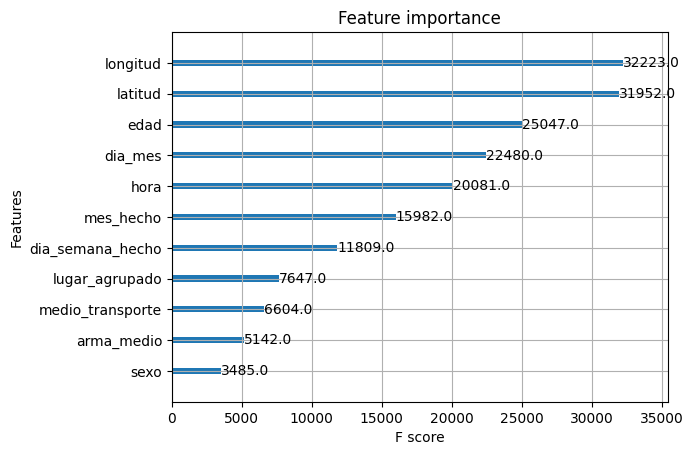

In [299]:
xgb.plot_importance(model, ax = plt.gca())

In [300]:
model.score(X_train, y_train)

0.9635533466674748

In [301]:
model.score(X_test, y_test)

0.8787771649460236

In [302]:
predict = model.predict(X_test)
predict

array([1, 2, 2, ..., 2, 1, 2])

In [303]:
from sklearn.metrics import confusion_matrix

In [307]:
confusion_matrix = confusion_matrix(y_test, predict)

In [308]:
# Verdaderos Positivos (Diagonal)
TP = np.diag(confusion_matrix)

# Falsos Positivos (Suma de columnas, menos los verdaderos positivos)
FP = np.sum(confusion_matrix, axis=0) - TP

# Falsos Negativos (Suma de filas, menos los verdaderos positivos)
FN = np.sum(confusion_matrix, axis=1) - TP

# Verdaderos Negativos (Total de la matriz, menos TP, FP, y FN)
TN = np.sum(confusion_matrix) - (FP + FN + TP)

# Exactitud
accuracy = np.sum(TP) / np.sum(confusion_matrix)

# Precisión, Sensibilidad, F1 Score
precision = TP / (TP + FP)
recall = TP / (TP + FN)
f1_score = 2 * (precision * recall) / (precision + recall)

print(f"Exactitud: {accuracy:.2f}")
print(f"Precisión por clase: {precision}")
print(f"Sensibilidad por clase: {recall}")
print(f"F1 Score por clase: {f1_score}")

Exactitud: 0.88
Precisión por clase: [0.64455364 0.81913249 0.93474265 0.84895636]
Sensibilidad por clase: [0.55638035 0.91899612 0.88080324 0.7537062 ]
F1 Score por clase: [0.59723013 0.86619549 0.90697168 0.7985008 ]


In [281]:
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans, DBSCAN

In [282]:
scaler = StandardScaler()
hurtos_scaled = scaler.fit_transform(datos_regresion)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

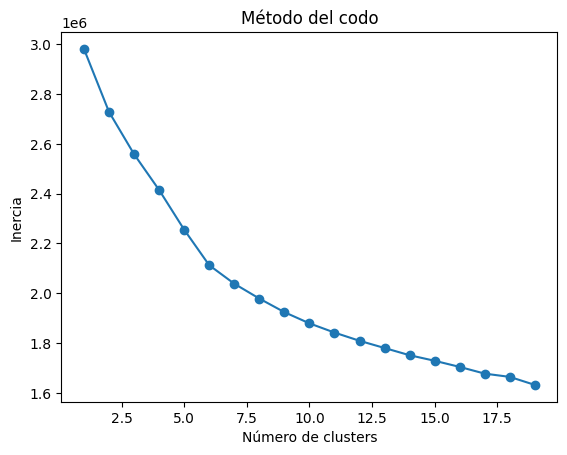

In [109]:
inertias = []
for i in range(1, 20):
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(hurtos_scaled)
    inertias.append(kmeans.inertia_)

plt.plot(range(1, 20), inertias, marker='o')
plt.title('Método del codo')
plt.xlabel('Número de clusters')
plt.ylabel('Inercia')
plt.show()

In [283]:
kmeans = KMeans(n_clusters=21, random_state=0)
datos_regresion['kmeans_cluster'] = kmeans.fit_predict(hurtos_scaled)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
<ipython-input-283-ba786e505ffe>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  datos_regresion['kmeans_cluster'] = kmeans.fit_predict(hurtos_scaled)


In [284]:
cluster_counts = datos_regresion['kmeans_cluster'].value_counts().sort_index()
cluster_counts

kmeans_cluster
0     11968
1     13934
2     12742
3     15168
4     14329
5     18592
6      6225
7     11790
8     15454
9     21398
10    13060
11     6187
12    14290
13    12096
14    14329
15    13748
16    12949
17    13599
18    16714
19     8150
20    16118
Name: count, dtype: int64

In [285]:
hurto_barrios["kmeans_cluster"] = datos_regresion["kmeans_cluster"]

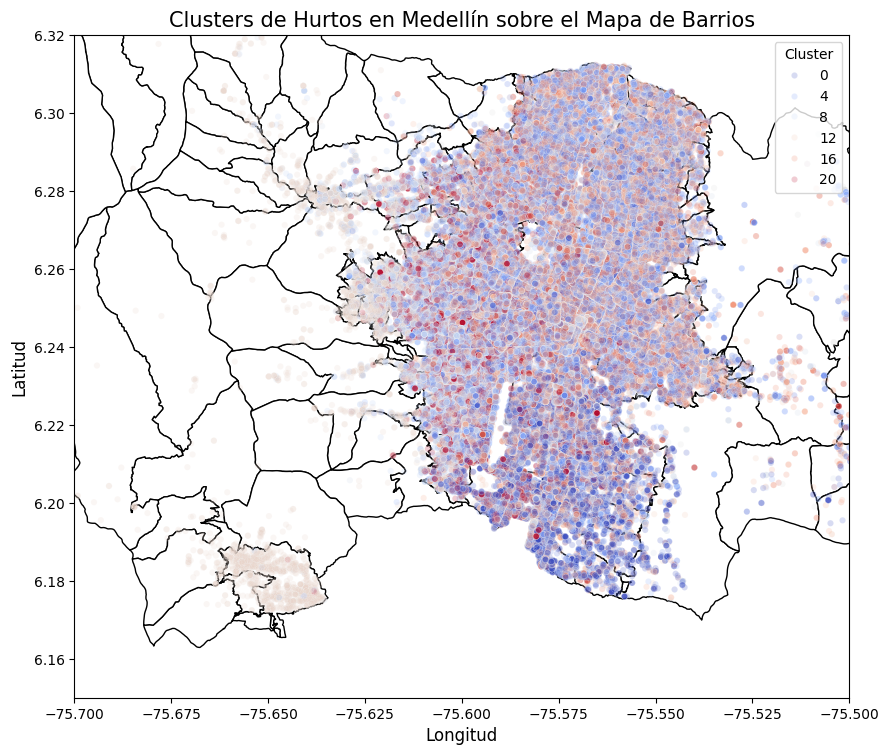

In [286]:
barrios_solo = gpd.read_file("/content/drive/MyDrive/hurtos/BarrioVereda_2014.shp")
# Crear un plot de los barrios de Medellín
fig, ax = plt.subplots(figsize=(10, 10))
barrios_solo.plot(ax=ax, edgecolor='black', color='white')

# Ajustar los límites del mapa
ax.set_xlim([-75.70, -75.5])
ax.set_ylim([6.15, 6.32])

# Superponer los puntos de los clusters
sns.scatterplot(
    x='longitud', y='latitud', hue='kmeans_cluster',
    data=hurto_barrios, palette='coolwarm', alpha=0.2, s=20, ax=ax
)

# Mejorar la visualización
plt.title('Clusters de Hurtos en Medellín sobre el Mapa de Barrios', fontsize=15)
plt.xlabel('Longitud', fontsize=12)
plt.ylabel('Latitud', fontsize=12)
plt.legend(title='Cluster', fontsize=10, loc='upper right')
plt.show()

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.208601 -75.574480  0.062584  33.948446        0.780498   
1               6.246918 -75.573381  0.025836  30.704464        0.525764   
2               6.249802 -75.573139  0.000000  59.575498        0.717548   
3               6.246625 -75.576028  1.000000  32.573510        7.549908   
4               6.268710 -75.564756  0.083328  32.558099        0.525647   
5               6.246626 -75.576887  0.000000  31.997472        7.563468   
6               6.241007 -75.574725  0.144900  38.089639        2.717751   
7               6.247925 -75.574538  1.000000  58.988041        0.881764   
8               6.246496 -75.599635  0.000065  33.579656        0.907532   
9               6.246353 -75.575162  0.517338  33.883774        0.389335   
10              6.254515 -75.571476  0.999234  30.477489        0.473430   
11          

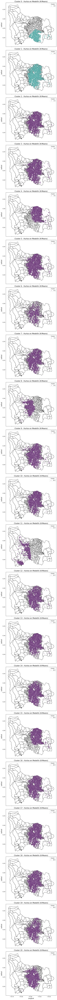


Descripción de características dentro de clusters:
                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.208601 -75.574480  0.062584  33.948446        0.780498   
1               6.246918 -75.573381  0.025836  30.704464        0.525764   
2               6.249802 -75.573139  0.000000  59.575498        0.717548   
3               6.246625 -75.576028  1.000000  32.573510        7.549908   
4               6.268710 -75.564756  0.083328  32.558099        0.525647   
5               6.246626 -75.576887  0.000000  31.997472        7.563468   
6               6.241007 -75.574725  0.144900  38.089639        2.717751   
7               6.247925 -75.574538  1.000000  58.988041        0.881764   
8               6.246496 -75.599635  0.000065  33.579656        0.907532   
9               6.246353 -75.575162  0.517338  33.883774        0.389335   
10              6.254515 -75.571476 

In [288]:
# Calcular estadísticas descriptivas dentro de cada cluster
cluster_descriptions = datos_regresion.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

# Número de clusters
num_clusters = len(cluster_descriptions)

# Crear subplots
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, num_clusters * 6), sharex=True, sharey=True)

# Asegurar que axes es una lista para iterar sobre ella
if num_clusters == 1:
    axes = [axes]

# Plotear cada cluster por separado
for i, ax in enumerate(axes):
    # Trazar el mapa de los barrios
    barrios_solo.plot(ax=ax, edgecolor='black', color='white')

    # Filtrar datos del cluster actual
    cluster_data = hurto_barrios[hurto_barrios['kmeans_cluster'] == i]

    # Superponer los puntos de los clusters
    sns.scatterplot(
        x='longitud', y='latitud', hue='kmeans_cluster',
        data=cluster_data, palette='viridis', alpha=0.6, s=20, ax=ax
    )

    ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=15)
    ax.set_xlabel('Longitud', fontsize=12)
    ax.set_ylabel('Latitud', fontsize=12)
    ax.legend(title='Cluster', fontsize=10, loc='upper right')

# Ajustar la visualización global
plt.tight_layout()
plt.show()

# Mostrar las características de cada cluster
print("\nDescripción de características dentro de clusters:")
print(cluster_descriptions)

                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.208601 -75.574480  0.062584  33.948446        0.780498   
1               6.246918 -75.573381  0.025836  30.704464        0.525764   
2               6.249802 -75.573139  0.000000  59.575498        0.717548   
3               6.246625 -75.576028  1.000000  32.573510        7.549908   
4               6.268710 -75.564756  0.083328  32.558099        0.525647   
5               6.246626 -75.576887  0.000000  31.997472        7.563468   
6               6.241007 -75.574725  0.144900  38.089639        2.717751   
7               6.247925 -75.574538  1.000000  58.988041        0.881764   
8               6.246496 -75.599635  0.000065  33.579656        0.907532   
9               6.246353 -75.575162  0.517338  33.883774        0.389335   
10              6.254515 -75.571476  0.999234  30.477489        0.473430   
11          

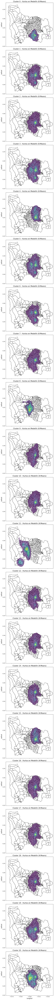


Descripción de características dentro de clusters:
                 latitud   longitud      sexo       edad  lugar_agrupado  \
kmeans_cluster                                                             
0               6.208601 -75.574480  0.062584  33.948446        0.780498   
1               6.246918 -75.573381  0.025836  30.704464        0.525764   
2               6.249802 -75.573139  0.000000  59.575498        0.717548   
3               6.246625 -75.576028  1.000000  32.573510        7.549908   
4               6.268710 -75.564756  0.083328  32.558099        0.525647   
5               6.246626 -75.576887  0.000000  31.997472        7.563468   
6               6.241007 -75.574725  0.144900  38.089639        2.717751   
7               6.247925 -75.574538  1.000000  58.988041        0.881764   
8               6.246496 -75.599635  0.000065  33.579656        0.907532   
9               6.246353 -75.575162  0.517338  33.883774        0.389335   
10              6.254515 -75.571476 

In [287]:
cluster_descriptions = datos_regresion.groupby('kmeans_cluster').mean()
print(cluster_descriptions)

# Número de clusters
num_clusters = len(cluster_descriptions)

# Crear subplots
fig, axes = plt.subplots(num_clusters, 1, figsize=(10, num_clusters * 6), sharex=True, sharey=True)

# Asegurar que axes es una lista para iterar sobre ella
if num_clusters == 1:
    axes = [axes]

# Plotear cada cluster por separado
for i, ax in enumerate(axes):
    # Trazar el mapa de los barrios
    barrios_solo.plot(ax=ax, edgecolor='black', color='white')

    # Filtrar datos del cluster actual
    cluster_data = hurto_barrios[hurto_barrios['kmeans_cluster'] == i]

    # Superponer el KDE de los clusters
    sns.kdeplot(
        x=cluster_data['longitud'], y=cluster_data['latitud'],
        fill=True, cmap='viridis', alpha=0.6, ax=ax
    )

    ax.set_title(f'Cluster {i} - Hurtos en Medellín (K-Means)', fontsize=15)
    ax.set_xlabel('Longitud', fontsize=12)
    ax.set_ylabel('Latitud', fontsize=12)

# Ajustar la visualización global
plt.tight_layout()
plt.show()

# Mostrar las características de cada cluster
print("\nDescripción de características dentro de clusters:")
print(cluster_descriptions)

SVM

In [47]:
from sklearn.svm import SVC
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV